# Wstęp do multimediów - Laboratorium 4

```
Bartłomiej Krawczyk
310774

Grupa 103
```

# Funkcje pomocnicze

In [67]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display

### Pliki

In [68]:
image_dir = './images/'
image_name = image_dir + 'latarnia2_col.png'
inoise_1_image_name = image_dir + 'latarnia2_col_inoise_1.png'
inoise_2_image_name = image_dir + 'latarnia2_col_inoise_2.png'
noise_image_name = image_dir + 'latarnia2_col_noise.png'


### Wyświetlanie obrazu

In [69]:
OUTPUT_IMAGE_FILE_PATH = './output/output.png'
def show_image(image):
    cv2.imwrite(OUTPUT_IMAGE_FILE_PATH, image)
    display(Image(filename=OUTPUT_IMAGE_FILE_PATH))


### Obliczanie PSNR

In [70]:
def calculate_psnr(img1, img2):
  imax = 255. ** 2
  mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size
  return 10.0*np.log10(imax/mse)


W sprawozdaniu należy zamieścić wyniki uzyskane dla obrazu testowego, wybranego na podstawie numeru indeksu w następujący sposób: 

`numer_obrazu = numer_indeksu % liczba_obrazow`

gdzie  numer  obrazu  wskazuje  pozycję pliku na posortowanej alfabetycznie liście nazw plików  testowych (pozycje numerowane od 0, tak jak elementy list w Pythonie), a % oznacza operację modulo). 

### Wylosowany obraz:

In [71]:
image_number = 310774 % 36
print(f'{image_number = }')

image_number = 22


Obraz o numerze 22 to `latarnia2_col.png`.

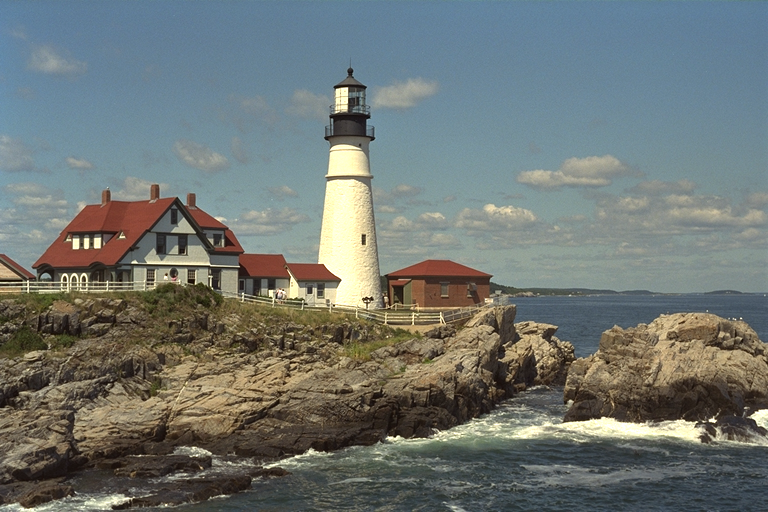

In [72]:
image = cv2.imread(image_name, cv2.IMREAD_UNCHANGED)
show_image(image)

# 1. Zrealizować operację filtracji barwnego obrazu cyfrowego.

Do realizacji zadania wykorzystać obrazy zaszumione (szumem gaussowskim oraz impulsowym). 

- Każdy  z  obrazów  wejściowych  poddać  przetwarzaniu filtrem wygładzającym (Gaussa) i filtrem medianowym.
- Każdy obraz wynikowy wyświetlić i obliczyć dla niego PSNR (w stosunku do obrazu oryginalnego,  nie  zaszumionego!,  funkcja do  obliczania PSNR  dostępna  jest  w  przykładowym skrypcie).
- Ocenić działanie filtrów dla masek o rozmiarach: 3x3, 5x5, 7x7.  
- Zebrać w tabeli PSNR dla różnych rodzajów szumów, filtrów i rozmiarów maski.  
 
Jaki wpływ na skuteczność filtracji i na zniekształcenie obrazu ma rozmiar maski filtru?   

Czy  ocena  subiektywna  uzyskanych obrazów wynikowych,  jest  zgodna  z  PSNR  (lepsza jakość – większy PSNR)?   

Opisać wnioski w sprawozdaniu.

### Obraz oryginalny

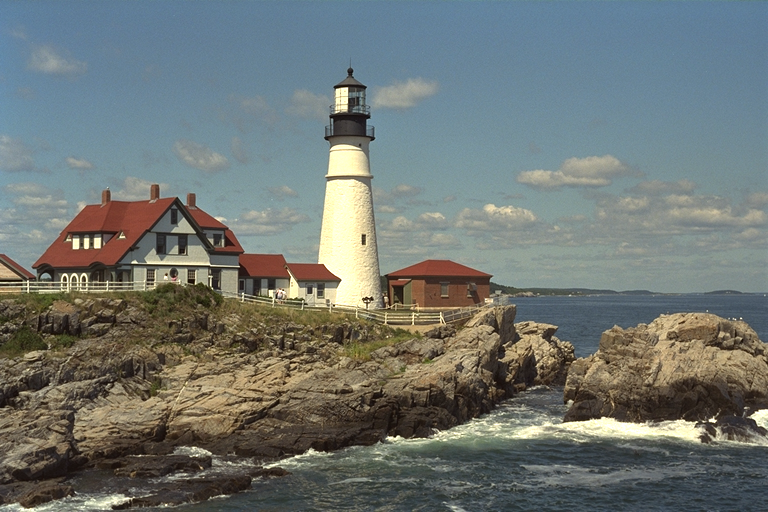

In [73]:
ORIGINAL_IMAGE = cv2.imread(image_name, cv2.IMREAD_UNCHANGED)

def gaussian_blur(image, ksize):
    image_blurred = cv2.GaussianBlur(image, ksize, 0)
    psnr_score = calculate_psnr(ORIGINAL_IMAGE, image_blurred)
    print(f'Mask: {ksize[0]} x {ksize[1]}')
    print(f'{psnr_score = }')
    show_image(image_blurred)


def median_blur(image, ksize):
    image_blurred = cv2.medianBlur(image, ksize)
    psnr_score = calculate_psnr(ORIGINAL_IMAGE, image_blurred)
    print(f'Mask: {ksize} x {ksize}')
    print(f'{psnr_score = }')
    show_image(image_blurred)

show_image(ORIGINAL_IMAGE)


## Obraz zaszumiony szumem gaussowskim

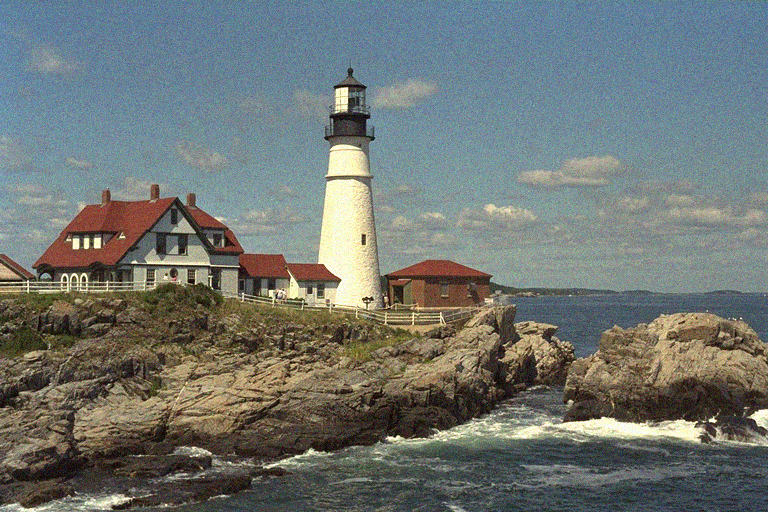

In [74]:
noise_image = cv2.imread(noise_image_name, cv2.IMREAD_UNCHANGED)
show_image(noise_image)

## Filtr Gaussa

Mask: 3 x 3
psnr_score = 28.66190057943669


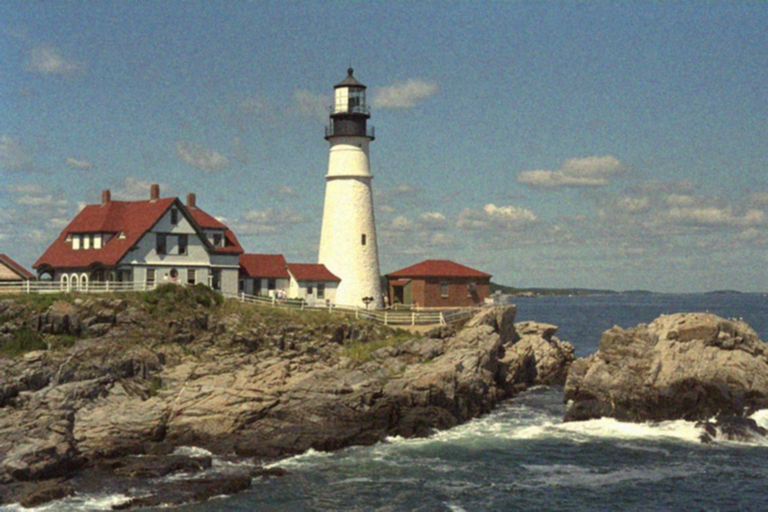

Mask: 5 x 5
psnr_score = 27.108994762842897


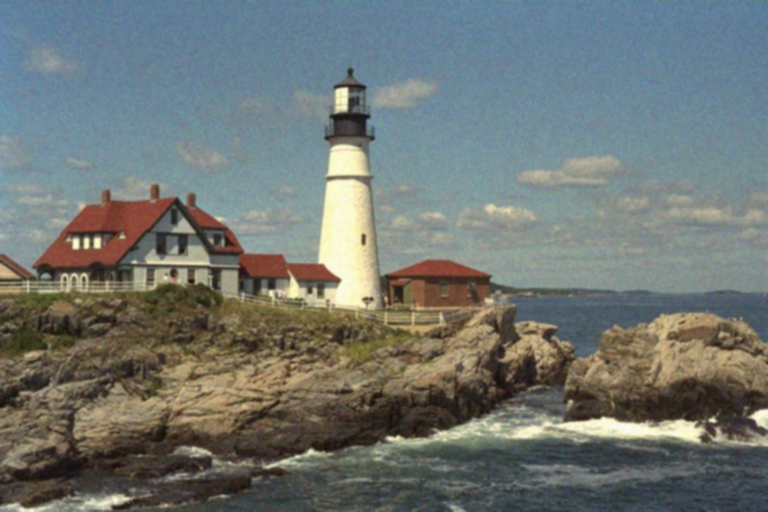

Mask: 7 x 7
psnr_score = 25.710630441088842


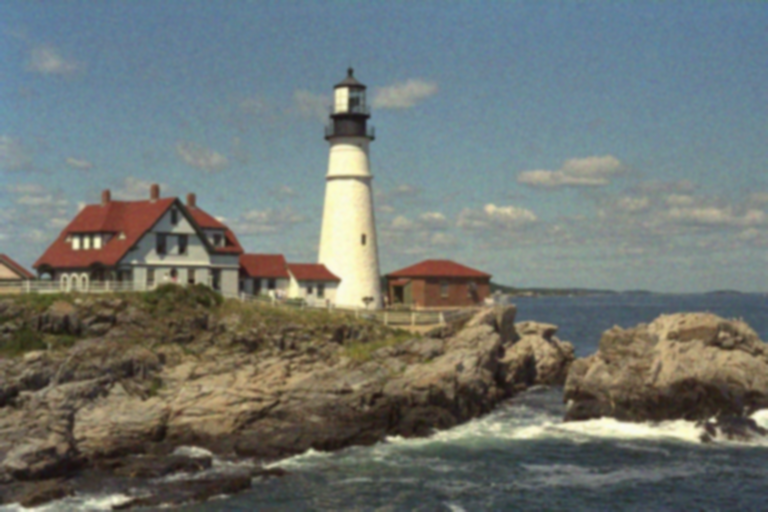

In [75]:
gaussian_blur(noise_image, (3, 3))
gaussian_blur(noise_image, (5, 5))
gaussian_blur(noise_image, (7, 7))

## Filtr Medianowy

Mask: 3 x 3
psnr_score = 27.348860497497913


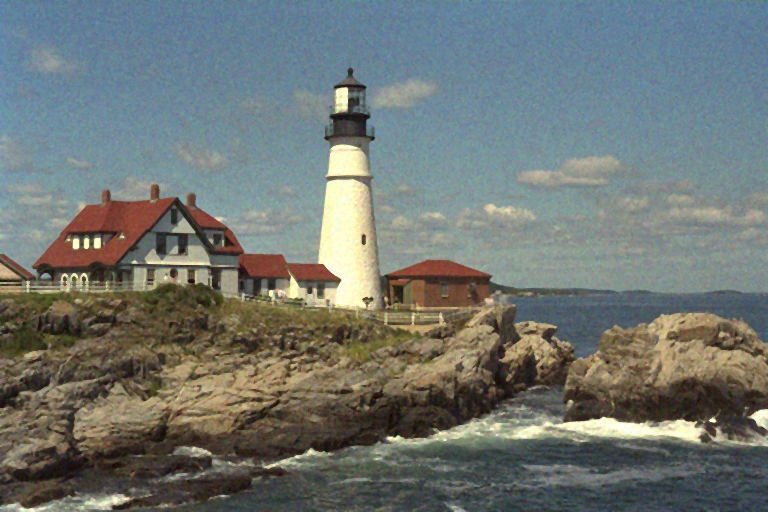

Mask: 5 x 5
psnr_score = 24.992358523856787


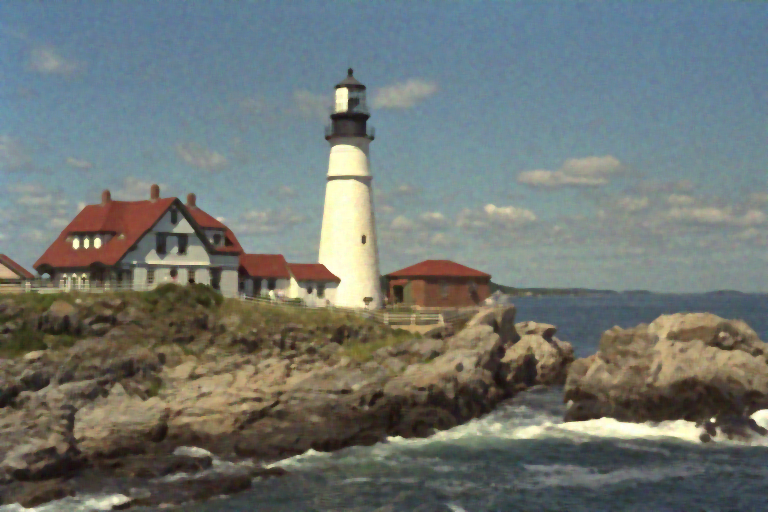

Mask: 7 x 7
psnr_score = 24.01827748802768


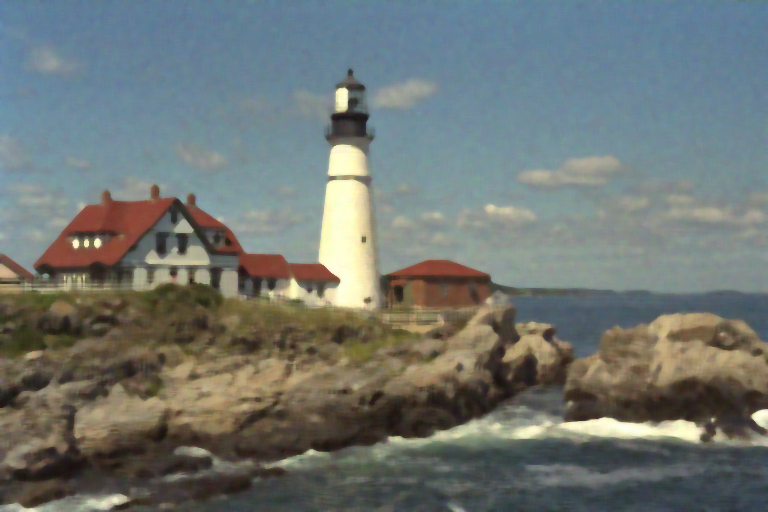

In [76]:
median_blur(noise_image, 3)
median_blur(noise_image, 5)
median_blur(noise_image, 7)

## Obraz zaszumiony szumem impulsowym 1

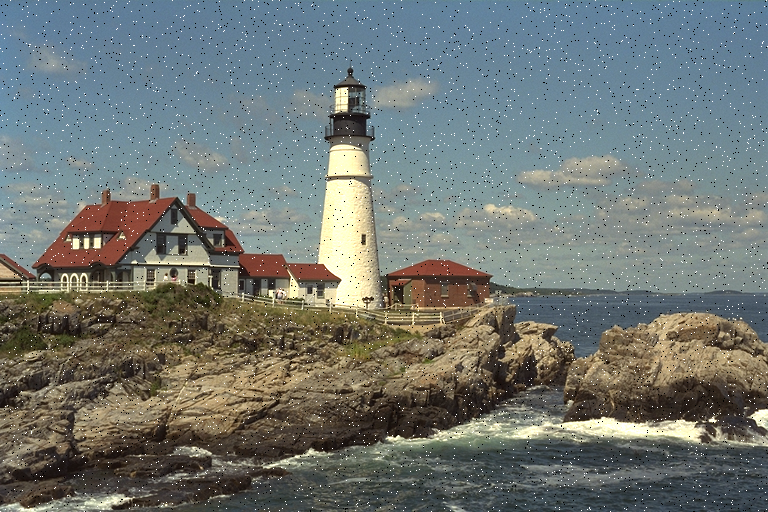

In [77]:
inoise_1_image = cv2.imread(inoise_1_image_name, cv2.IMREAD_UNCHANGED)
show_image(inoise_1_image)

## Filtr Gaussa

Mask: 3 x 3
psnr_score = 27.39869053703748


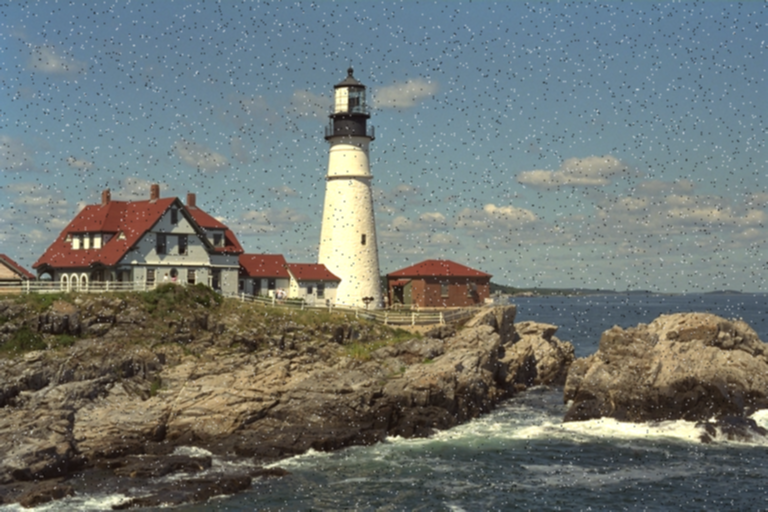

Mask: 5 x 5
psnr_score = 26.558850329590292


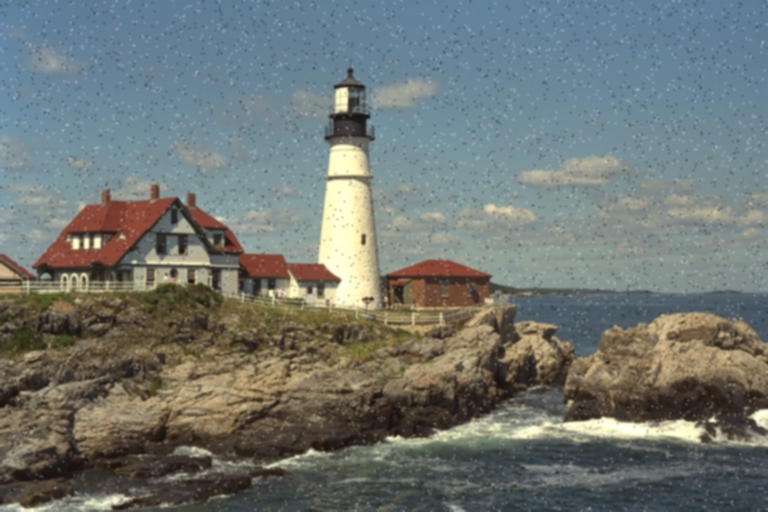

Mask: 7 x 7
psnr_score = 25.460249315985017


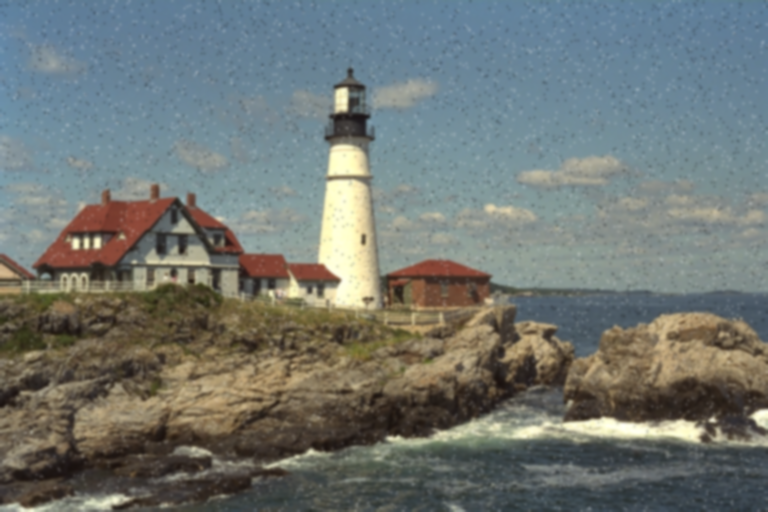

In [78]:
gaussian_blur(inoise_1_image, (3, 3))
gaussian_blur(inoise_1_image, (5, 5))
gaussian_blur(inoise_1_image, (7, 7))

## Filtr Medianowy

Mask: 3 x 3
psnr_score = 28.60866569092461


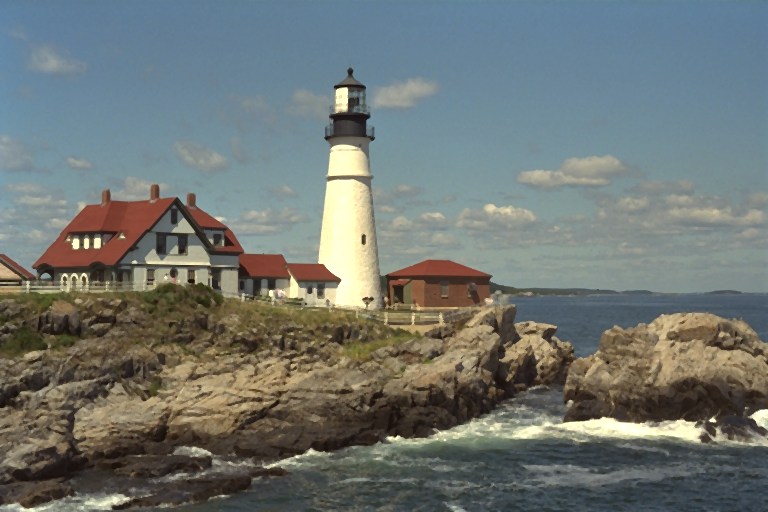

Mask: 5 x 5
psnr_score = 25.245995556490918


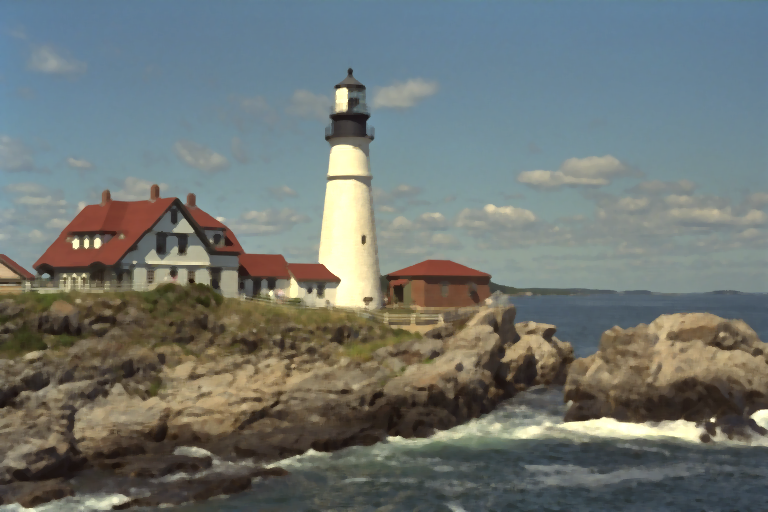

Mask: 7 x 7
psnr_score = 24.130047286654207


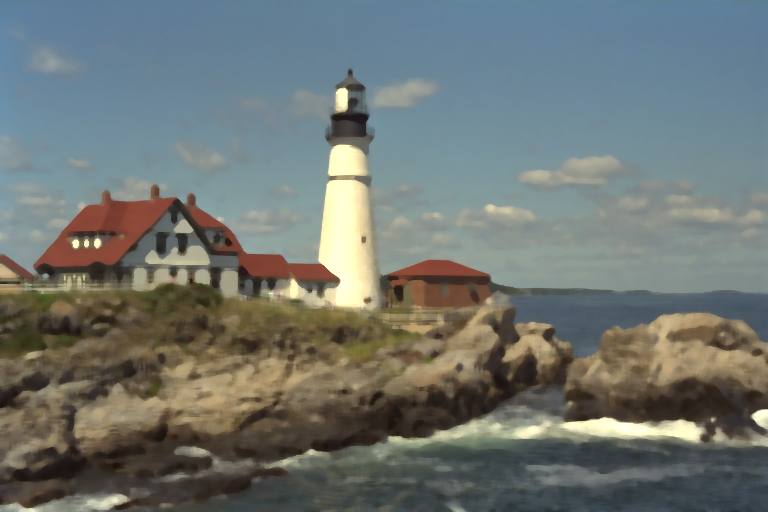

In [79]:
median_blur(inoise_1_image, 3)
median_blur(inoise_1_image, 5)
median_blur(inoise_1_image, 7)

## Obraz zaszumiony szumem impulsowym 2

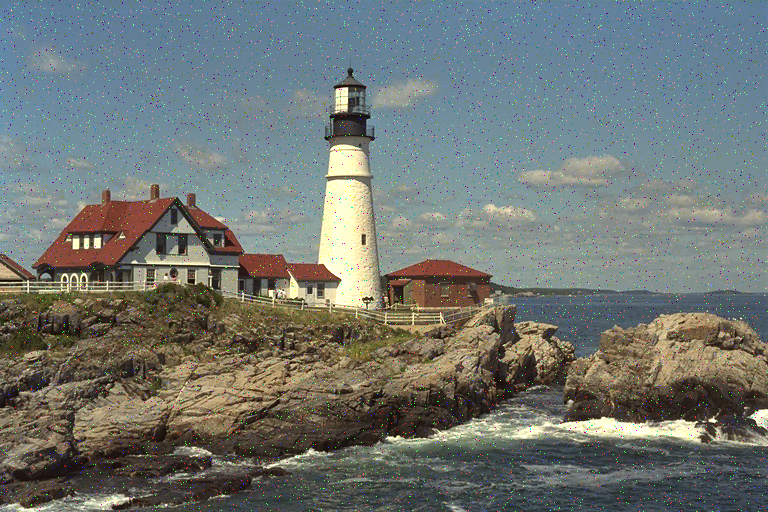

In [80]:
inoise_2_image = cv2.imread(inoise_2_image_name, cv2.IMREAD_UNCHANGED)
show_image(inoise_2_image)

## Filtr Gaussa

Mask: 3 x 3
psnr_score = 27.84310316349928


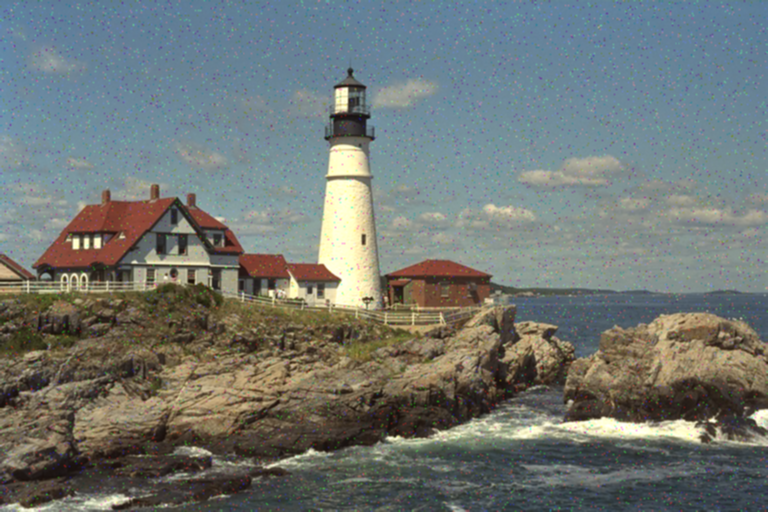

Mask: 5 x 5
psnr_score = 26.762877324826647


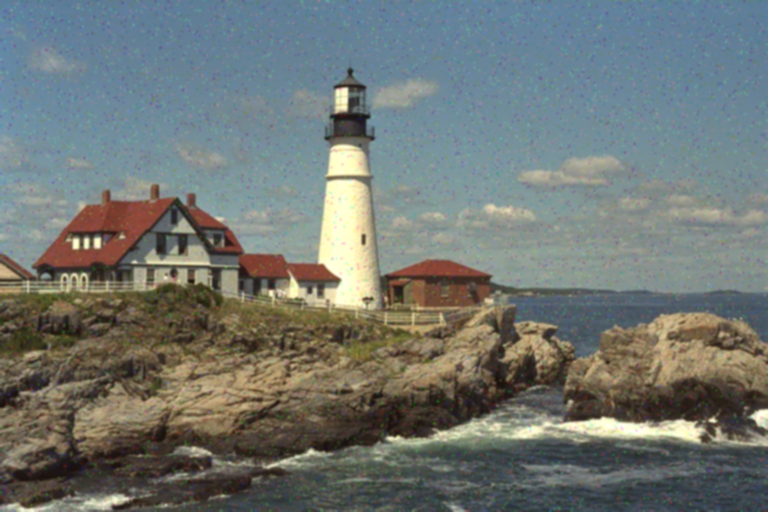

Mask: 7 x 7
psnr_score = 25.554198199148146


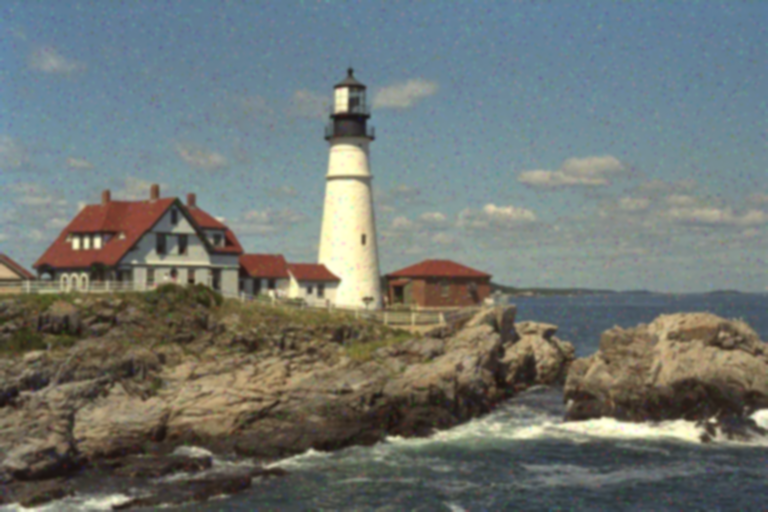

In [81]:
gaussian_blur(inoise_2_image, (3, 3))
gaussian_blur(inoise_2_image, (5, 5))
gaussian_blur(inoise_2_image, (7, 7))

# Filtr Medianowy

Mask: 3 x 3
psnr_score = 28.644179680756203


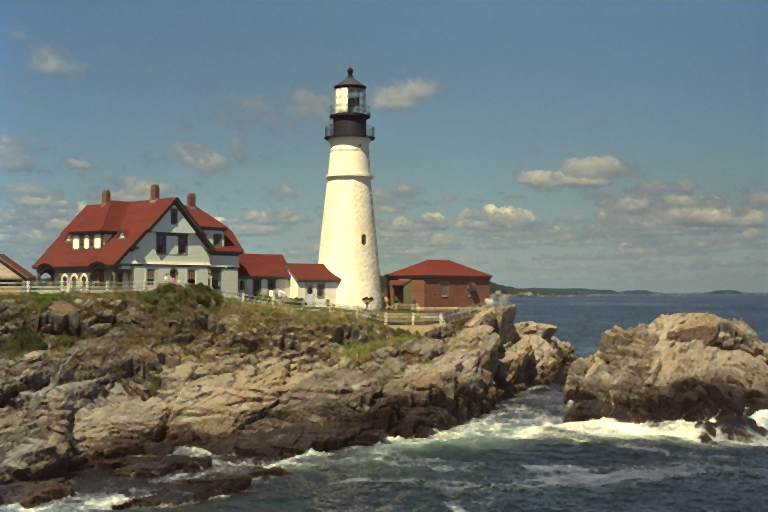

Mask: 5 x 5
psnr_score = 25.258237564910967


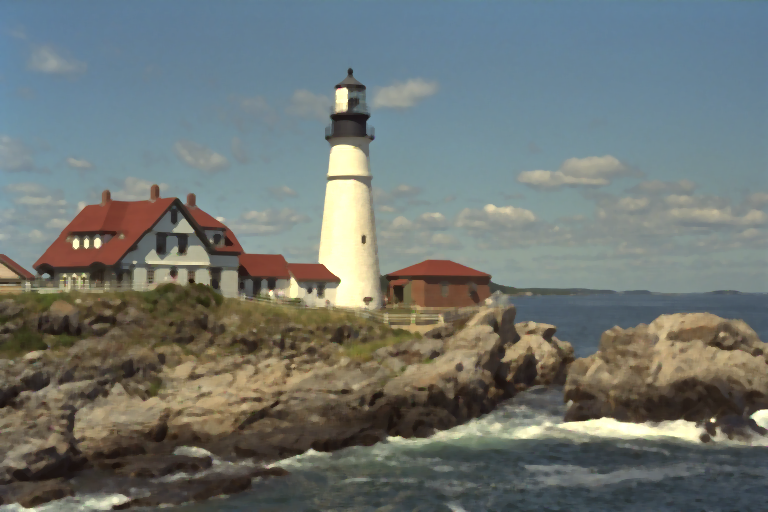

Mask: 7 x 7
psnr_score = 24.127243884622303


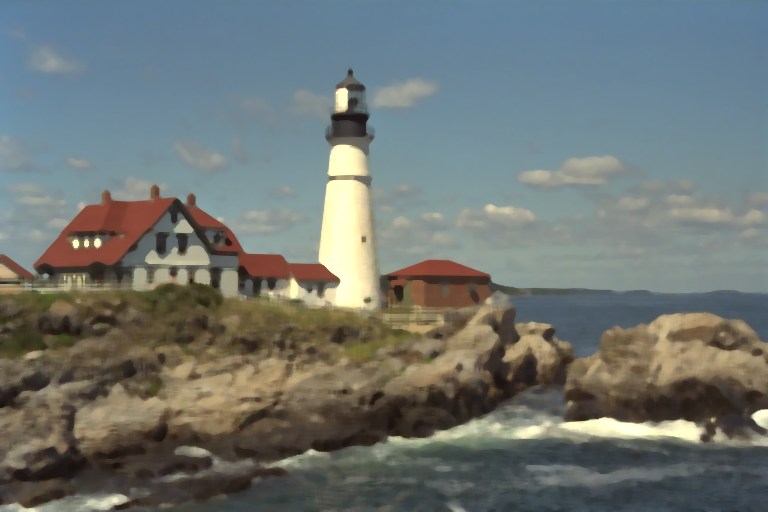

In [82]:
median_blur(inoise_2_image, 3)
median_blur(inoise_2_image, 5)
median_blur(inoise_2_image, 7)

# Tabela PSNR

### Filtr Gaussa

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| 3x3 | 28.66190057943669  | 27.39869053703748  | 27.84310316349928  |
| 5x5 | 27.108994762842897 | 26.558850329590292 | 26.762877324826647 |
| 7x7 | 25.710630441088842 | 25.460249315985017 | 25.554198199148146 |

### Filtr Medianowy

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| 3x3 | 27.348860497497913 | 28.60866569092461  | 28.644179680756203 |
| 5x5 | 24.992358523856787 | 25.245995556490918 | 25.258237564910967 |
| 7x7 | 24.01827748802768  | 24.130047286654207 | 24.127243884622303 |


## Pytania
Jaki wpływ na skuteczność filtracji i na zniekształcenie obrazu ma rozmiar maski filtru?   

Czy  ocena  subiektywna  uzyskanych obrazów wynikowych,  jest  zgodna  z  PSNR  (lepsza jakość – większy PSNR)?   

Opisać wnioski w sprawozdaniu.

# 2. Zrealizować operację wyrównania  histogramu  dla  obrazu  barwnego  i zapisać obraz wynikowy  do pliku.

`UWAGA`:  operację  wyrównania  histogramu  należy  wykonać  wyłącznie  dla  składowej odpowiadającej  za  jasność,  w  tym  celu  należy  wejściowy  obraz RGB skonwertować  do  innej przestrzeni  (np.  YCbCr/YUV), a po wyrównaniu histogramu dla właściwej składowej powrócić do 
pierwotnego formatu.

- Porównać uzyskane obrazy  i  ich  histogramy  (w szczególności: histogram dla składowej, dla której wykonano operację wyrównywania histogramu).   

Czy obraz po wyrównaniu histogramu jest subiektywnie lepszej jakości?

# 3. Korzystając  z  filtru  Laplace’a do  wyznaczenia  wysokoczęstotliwościowych  składowych obrazu dokonać wyostrzenia obrazu:  

`img_out = img_in + W*img_laplace`

Jaki jest wpływ wagi składowej wysokoczęstotliwościowej na postać obrazu wynikowego?

Dla jakich wartości tej wagi uzyskuje się dobre, przyjemne dla oka wyniki?   

`Uwaga`: należy pamiętać, że wyostrzanie obrazu powoduje również uwydatnienie szumu w obrazie, w niektórych przypadkach (niezbyt dobrej jakości obrazów oryginalnych) przydatne może być wstępne wygładzenie obrazu filtrem dolnoprzepustowym (np. filtrem Gaussa).

`Wskazówka`: wykorzystać funkcję cv2.addWeighted()  do sumowania  obrazów i równoczesnej konwersji wyniku do 8-bitowych liczb całkowitych z przedziału [0, 255].

`Uwaga`:  ze  względu  na  sposób  wyliczania  laplasjanu  w bibliotece OpenCV w  celu  uzyskania ‘dobrych’ wyników  należy odjąć  ‘obraz  wysokoczęstotliwościowy’, czyli zastosować  ujemne wartości wagi W.  
 